In [1]:
import zipfile
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from tqdm import tqdm
from wordcloud import WordCloud
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report


tqdm.pandas()
%matplotlib inline

# Import Data


In [2]:
with zipfile.ZipFile("data/Raw/audio-features-and-lyrics-of-spotify-songs.zip") as z:
    with z.open("spotify_songs.csv") as f:
        df = pd.read_csv(f)

In [3]:
df.columns

Index(['track_id', 'track_name', 'track_artist', 'lyrics', 'track_popularity',
       'track_album_id', 'track_album_name', 'track_album_release_date',
       'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre',
       'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness',
       'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo',
       'duration_ms', 'language'],
      dtype='object')

In [4]:
df.drop(columns=["track_album_id", "playlist_id"]).head()

,track_id,track_name,track_artist,lyrics,track_popularity,track_album_name,track_album_release_date,playlist_name,playlist_genre,playlist_subgenre,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,language
0,0017A6SJgTbfQVU2EtsPNo,Pangarap,Barbie's Cradle,Minsan pa Nang ako'y napalingon Hindi ko alam ...,41,Trip,2001-01-01,Pinoy Classic Rock,rock,classic rock,...,-10.068,1,0.0236,0.27900,0.01170,0.0887,0.566,97.091,235440,tl
1,004s3t0ONYlzxII9PLgU6z,I Feel Alive,Steady Rollin,"The trees, are singing in the wind The sky blu...",28,Love & Loss,2017-11-21,Hard Rock Workout,rock,hard rock,...,-4.739,1,0.0442,0.01170,0.00994,0.3470,0.404,135.225,373512,en
2,00chLpzhgVjxs1zKC9UScL,Poison,Bell Biv DeVoe,"NA Yeah, Spyderman and Freeze in full effect U...",0,Gold,2005-01-01,"Back in the day - R&B, New Jack Swing, Swingbe...",r&b,new jack swing,...,-7.504,0,0.2160,0.00432,0.00723,0.4890,0.650,111.904,262467,en
3,00cqd6ZsSkLZqGMlQCR0Zo,Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,I really can't stay Baby it's cold outside I'v...,41,CeeLo's Magic Moment,2012-10-29,Christmas Soul,r&b,neo soul,...,-5.819,0,0.0341,0.68900,0.00000,0.0664,0.405,118.593,243067,en
4,00emjlCv9azBN0fzuuyLqy,Dumb Litty,KARD,Get up out of my business You don't keep me fr...,65,KARD 2nd Digital Single ‘Dumb Litty’,2019-09-22,K-Party Dance Mix,pop,dance pop,...,-1.993,1,0.0409,0.03700,0.00000,0.1380,0.240,130.018,193160,en


# Details


In [5]:
print("Data Shape    :", df.shape)
print("Data Columns  :", df.columns.tolist())
print("Song Count    :", df["track_id"].nunique())
print("Artist Count  :", df["track_artist"].nunique())
print("Genre Count   :", df["playlist_genre"].nunique())

Data Shape    : (18454, 25)
Data Columns  : ['track_id', 'track_name', 'track_artist', 'lyrics', 'track_popularity', 'track_album_id', 'track_album_name', 'track_album_release_date', 'playlist_name', 'playlist_id', 'playlist_genre', 'playlist_subgenre', 'danceability', 'energy', 'key', 'loudness', 'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness', 'valence', 'tempo', 'duration_ms', 'language']
Song Count    : 18454
Artist Count  : 6031
Genre Count   : 6


## Specfications on English Language


In [6]:
df_clean = df[df["language"].isin(["en"])]

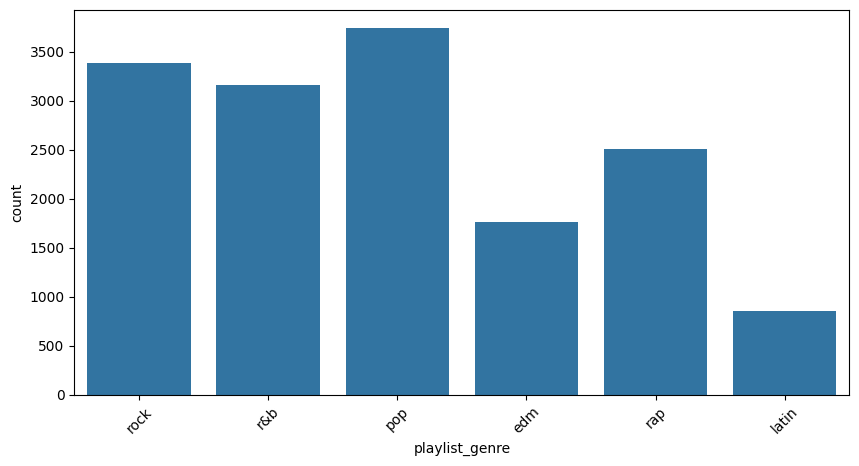

In [7]:
plt.figure(figsize=(10, 5))
sns.countplot(data=df_clean, x="playlist_genre")
plt.xticks(rotation=45)
plt.show()

# Exploratory Data Analysis


In [8]:
audio_features = [
    "danceability",
    "energy",
    "key",
    "loudness",
    "mode",
    "speechiness",
    "acousticness",
    "instrumentalness",
    "liveness",
    "valence",
    "tempo",
]

## Correlation Analysis


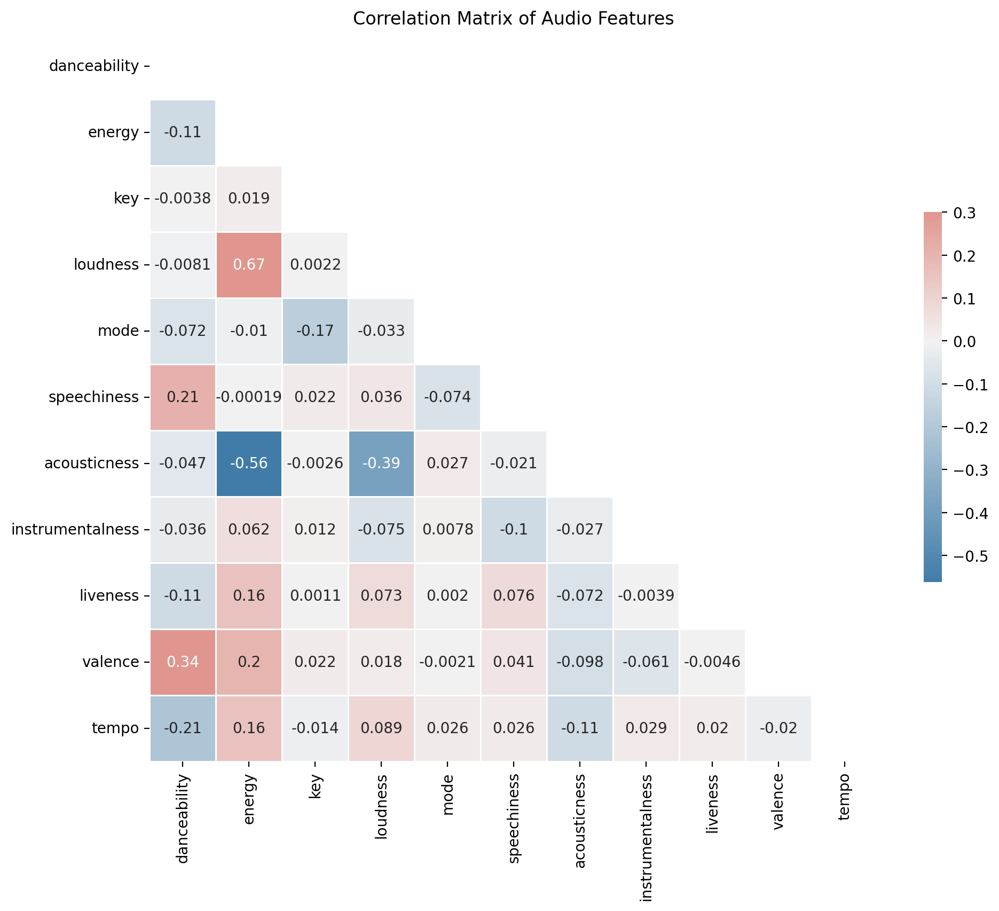

In [9]:
# Calculate correlation matrix
corr = df_clean[audio_features].corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

fig, ax = plt.subplots(figsize=(11, 9), dpi=200)

cmap = sns.diverging_palette(240, 15, as_cmap=True)

sns.heatmap(
    corr,
    mask=mask,
    cmap=cmap,
    vmax=0.3,
    center=0,
    square=True,
    linewidths=0.5,
    annot=True,
    cbar_kws={"shrink": 0.5},
)

plt.title("Correlation Matrix of Audio Features")

plt.savefig("image/audio_features_correlation.png")

## Acousticness vs Energy


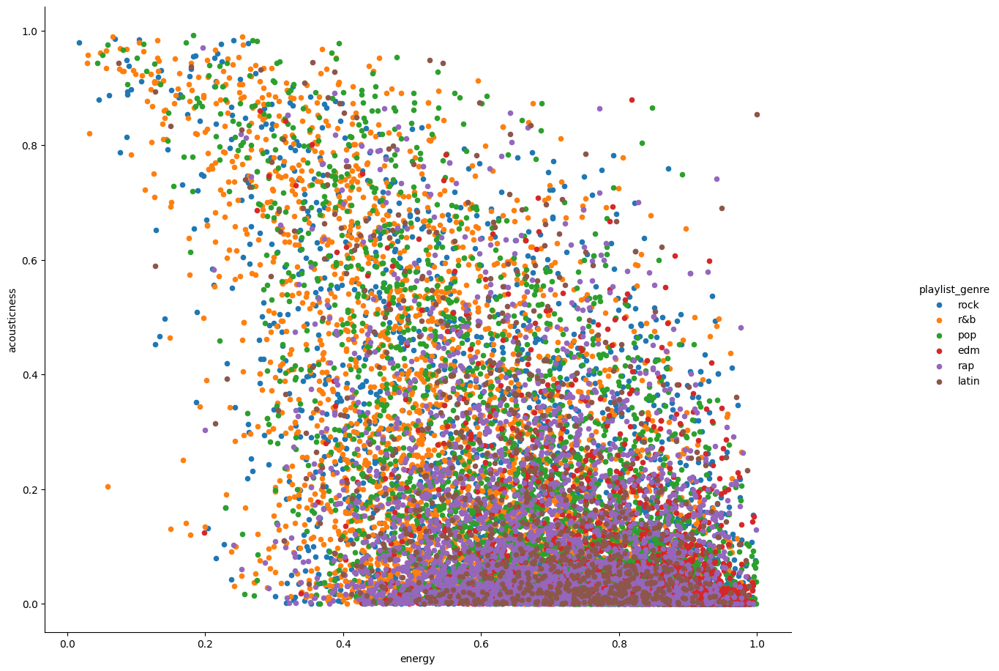

In [10]:
sns.lmplot(
    x="energy",
    y="acousticness",
    data=df_clean,
    hue="playlist_genre",
    fit_reg=False,
    scatter_kws={"s": 20, "alpha": 1},
)
fig = plt.gcf()
fig.set_size_inches(15, 10)
plt.rcParams["figure.dpi"] = 200
plt.savefig("image/acousticness_vs_energy_per_genre.png")

## Word Cloud


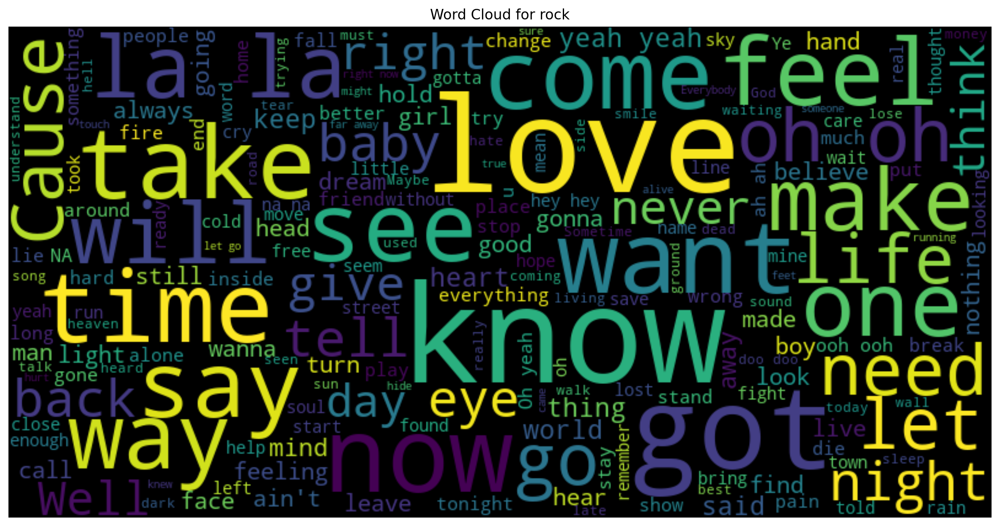

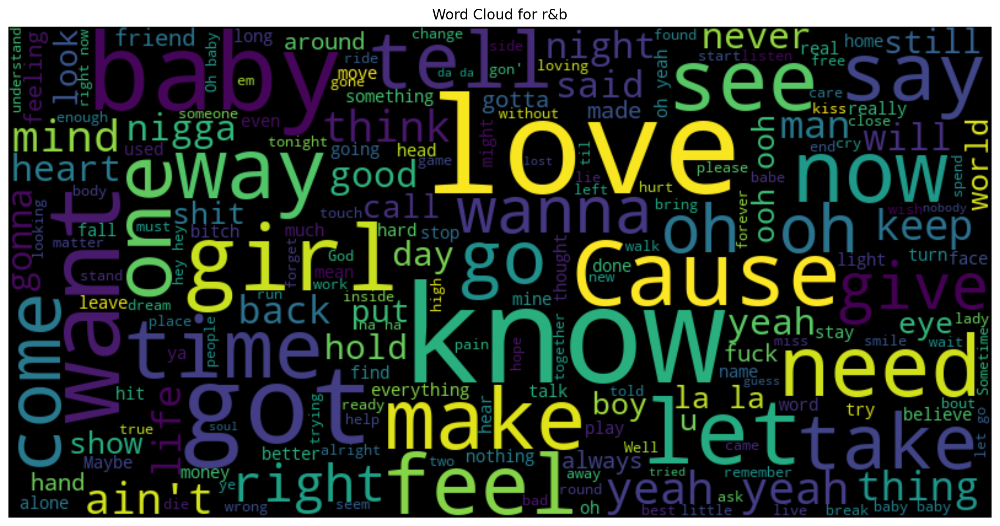

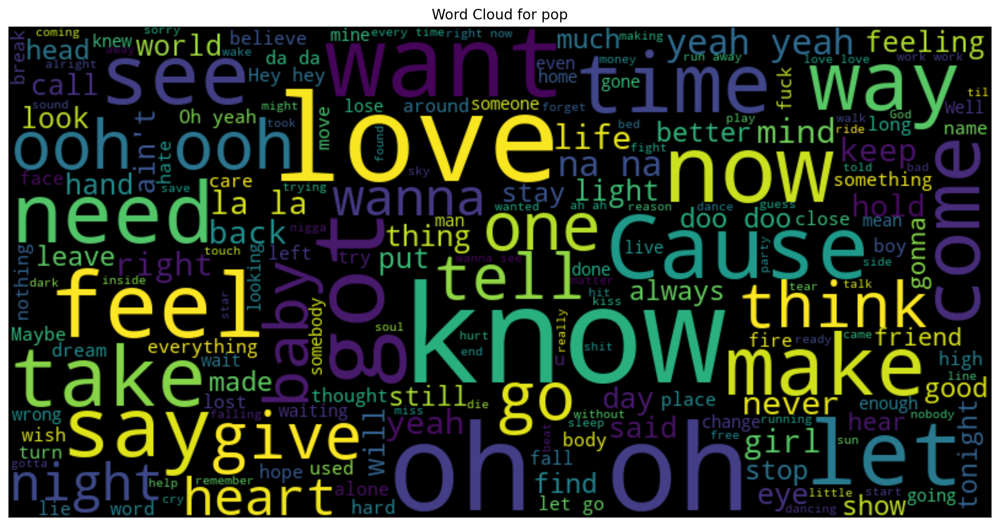

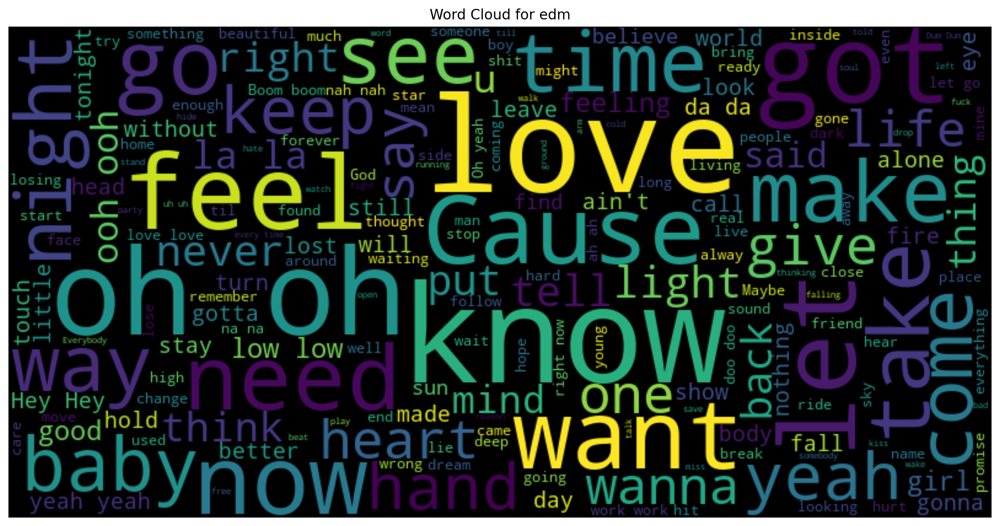

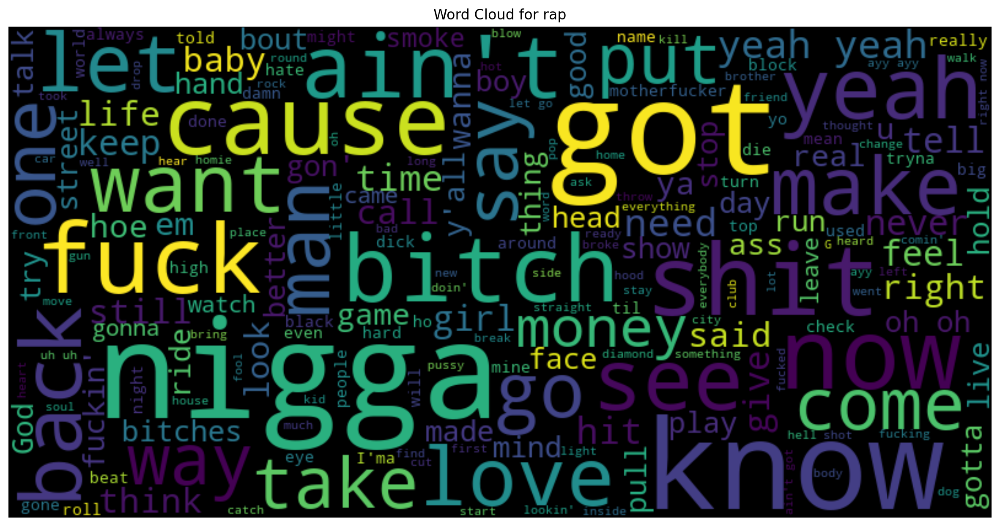

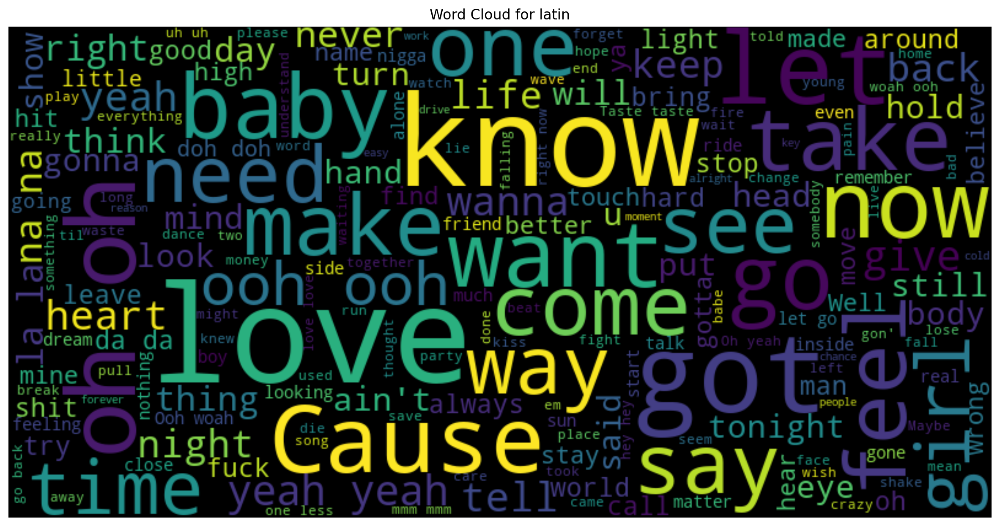

In [11]:
# word cloud for lyrics by genre
genre_list = df_clean["playlist_genre"].unique()

for genre in genre_list:
    text = " ".join(df_clean[df_clean["playlist_genre"] == genre]["lyrics"].dropna())
    wordcloud = WordCloud(
        width=800, height=400, random_state=21, max_font_size=110
    ).generate(text)

    plt.figure(figsize=(15, 10), dpi=200)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.title(f"Word Cloud for {genre}")
    plt.axis("off")

# Genre Analysis and Cleaning


## Remove Genres

Remove genres that were underrepresented in the dataset.


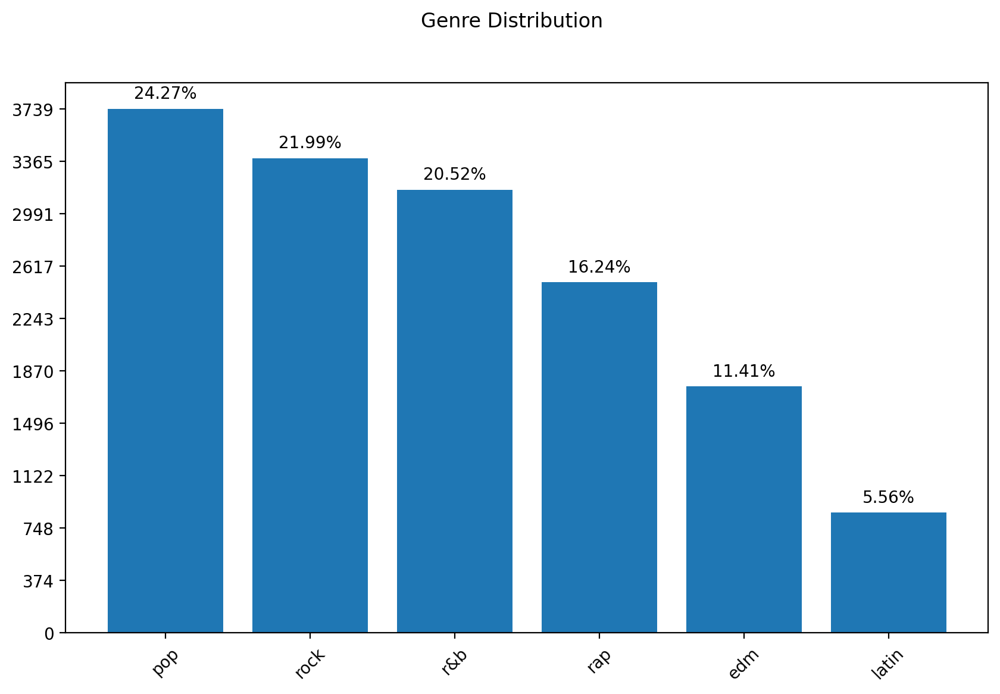

In [12]:
def plot_genre(df):
    counts = df["playlist_genre"].value_counts()
    x = counts.keys()
    max_count = df["playlist_genre"].value_counts().max()
    proportions = counts / counts.sum()  # Normalize

    fig, ax = plt.subplots(figsize=(10, 6))
    ax.bar(x, counts)
    for index, _ in enumerate(counts):
        ax.text(
            index,
            counts.iloc[index] + max_count / 50,
            f"{proportions.iloc[index]:.2%}",
            ha="center",
        )
    plt.xticks(rotation=45)
    plt.yticks(np.arange(0, max_count + max_count / 10, max_count / 10))
    fig.suptitle("Genre Distribution")


plot_genre(df_clean)

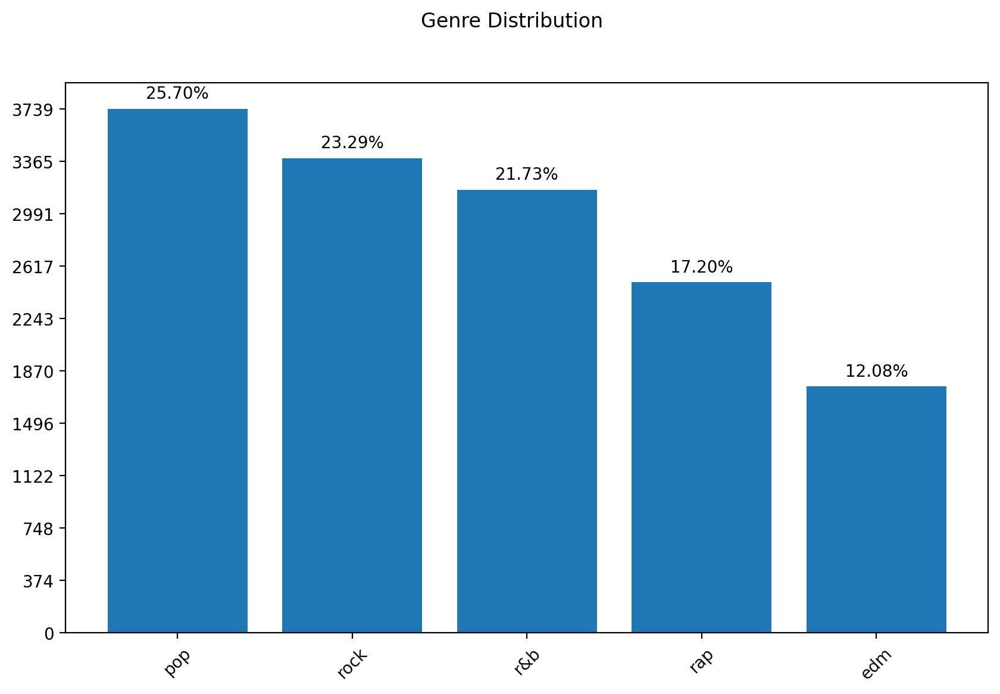

In [13]:
# Don't include latin genre
remove_genres = ["latin"]

df_new = df_clean.copy()
for genre in remove_genres:
    df_new = df_new[df_new["playlist_genre"] != genre]
df_clean = df_new
del df_new
plot_genre(df_clean)

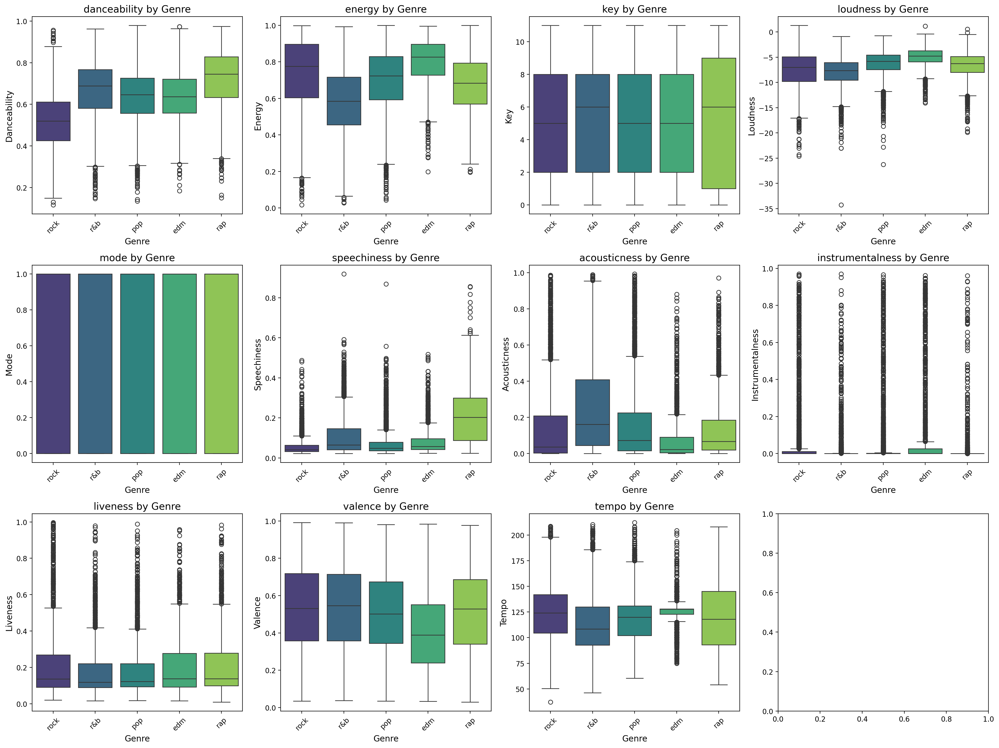

In [14]:
fig, axes = plt.subplots(3, 4, figsize=(20, 15), dpi=200)
axes = axes.ravel()

for i, feature in enumerate(audio_features):
    sns.boxplot(
        data=df_clean,
        x="playlist_genre",
        y=feature,
        ax=axes[i],
        palette="viridis",
        hue="playlist_genre",
        legend=False,
    )
    axes[i].set_title(f"{feature} by Genre", fontsize=14)
    axes[i].set_xlabel("Genre", fontsize=12)
    axes[i].set_ylabel(f"{feature.capitalize()}", fontsize=12)
    axes[i].tick_params(axis="x", rotation=45)

plt.tight_layout()
plt.savefig("image/audio_features_by_genre.png")

In [15]:
genre_mapping = {
    value: key for key, value in enumerate(set(df_clean["playlist_genre"]))
}
genre_mapping

{'rock': 0, 'rap': 1, 'r&b': 2, 'pop': 3, 'edm': 4}

In [16]:
df_clean["playlist_genre_id"] = (
    df_clean["playlist_genre"].infer_objects().map(genre_mapping)
)

In [17]:
df_clean.head()

,track_id,track_name,track_artist,lyrics,track_popularity,track_album_id,track_album_name,track_album_release_date,playlist_name,playlist_id,...,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,language,playlist_genre_id
1,004s3t0ONYlzxII9PLgU6z,I Feel Alive,Steady Rollin,"The trees, are singing in the wind The sky blu...",28,3z04Lb9Dsilqw68SHt6jLB,Love & Loss,2017-11-21,Hard Rock Workout,3YouF0u7waJnolytf9JCXf,...,1,0.0442,0.01170,0.00994,0.3470,0.404,135.225,373512,en,0
2,00chLpzhgVjxs1zKC9UScL,Poison,Bell Biv DeVoe,"NA Yeah, Spyderman and Freeze in full effect U...",0,6oZ6brjB8x3GoeSYdwJdPc,Gold,2005-01-01,"Back in the day - R&B, New Jack Swing, Swingbe...",3a9y4eeCJRmG9p4YKfqYIx,...,0,0.2160,0.00432,0.00723,0.4890,0.650,111.904,262467,en,2
3,00cqd6ZsSkLZqGMlQCR0Zo,Baby It's Cold Outside (feat. Christina Aguilera),CeeLo Green,I really can't stay Baby it's cold outside I'v...,41,3ssspRe42CXkhPxdc12xcp,CeeLo's Magic Moment,2012-10-29,Christmas Soul,6FZYc2BvF7tColxO8PBShV,...,0,0.0341,0.68900,0.00000,0.0664,0.405,118.593,243067,en,2
4,00emjlCv9azBN0fzuuyLqy,Dumb Litty,KARD,Get up out of my business You don't keep me fr...,65,7h5X3xhh3peIK9Y0qI5hbK,KARD 2nd Digital Single ‘Dumb Litty’,2019-09-22,K-Party Dance Mix,37i9dQZF1DX4RDXswvP6Mj,...,1,0.0409,0.03700,0.00000,0.1380,0.240,130.018,193160,en,3
5,00f9VGHfQhAHMCQ2bSjg3D,Soldier,James TW,"Hold your breath, don't look down, keep trying...",70,3GNzXsFbzdwM0WKCZtgeNP,Chapters,2019-04-26,urban contemporary,4WiB26kw0INKwbzfb5M6Tv,...,1,0.0550,0.28000,0.00000,0.0975,0.305,147.764,224720,en,2


## Split the data to Train, Validation and Test


In [18]:
# Genre Columns
genre_columns = [
    "playlist_genre",
    "playlist_genre_id",
]

# Lyrics Column
lyrics_column = [
    "lyrics",
]

# Audio Features Columns
audio_feature_columns = [
    "acousticness",
    "danceability",
    "energy",
    "instrumentalness",
    "key",
    "liveness",
    "loudness",
    "mode",
    "speechiness",
    "tempo",
    "valence",
]

# Feature Columns (Combine all)
feature_columns = genre_columns + lyrics_column + audio_feature_columns

df_train, df_test = train_test_split(
    df_clean[feature_columns],
    test_size=0.1,
    random_state=12123,
)

df_train, df_val = train_test_split(df_train, test_size=0.1, random_state=12123)

In [19]:
print("Train Shape:", df_train.shape)
print("Validation Shape:", df_val.shape)
print("Test Shape:", df_test.shape)

Train Shape: (11783, 14)
Validation Shape: (1310, 14)
Test Shape: (1455, 14)


In [20]:
df_train.head()

,playlist_genre,playlist_genre_id,lyrics,acousticness,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence
17622,r&b,2,When the sun is rising over streets so barren ...,0.7050,0.420,0.247,0.00349,2,0.1270,-13.370,0,0.0360,88.071,0.138
11015,rap,1,"This, is, how, we do We make a move and act a ...",0.0455,0.862,0.648,0.00000,4,0.0332,-7.401,0,0.2510,98.012,0.637
3024,rock,0,NA I go off to work on a Monday morning Tuesda...,0.4000,0.645,0.557,0.00183,3,0.0845,-9.108,1,0.0535,131.885,0.703
3543,rap,1,"Nah, nah-nah, nah-nah Ayy I don't like you, wh...",0.6980,0.840,0.400,0.00143,5,0.1160,-11.807,0,0.0516,124.009,0.381
14398,rap,1,"Yuuuuuuu Soulja Boy tell 'em Ayy, I got this n...",0.5150,0.736,0.740,0.00000,0,0.0468,-2.180,1,0.0786,140.141,0.803


## Balance the train data

The train data is imbalanced. We will balance the data by oversampling the minority classes.


In [21]:
# Limitation Sampling
def limit_sampling(df, column, sample_limit):
    """Limit the sampling of the dataframe based on the column."""
    balanced_df = pd.DataFrame()
    for unique_value in df[column].unique():
        value_subset = df[df[column] == unique_value]
        if len(value_subset) >= sample_limit:
            balanced_df = pd.concat(
                [
                    balanced_df,
                    value_subset.sample(sample_limit, random_state=12123),
                ]
            )
    balanced_df.reset_index(drop=True, inplace=True)
    return balanced_df

In [22]:
from sklearn.model_selection import StratifiedShuffleSplit

In [23]:
# Stratified Sampling
def stratified_sampling(df, column, sample_limit_per_group, random_state=12123):
    """Stratified Sampling based on the specified column."""
    grouping_column = column
    unique_groups = df[grouping_column].unique()
    balanced_df = pd.DataFrame()

    for group in unique_groups:
        group_subset = df[df[grouping_column] == group]
        if len(group_subset) >= sample_limit_per_group:
            splitter = StratifiedShuffleSplit(
                n_splits=1, test_size=sample_limit_per_group, random_state=random_state
            )
            _, sampled_indices = next(
                splitter.split(group_subset, group_subset[grouping_column])
            )
            balanced_df = pd.concat([balanced_df, group_subset.iloc[sampled_indices]])

    return balanced_df.sample(frac=1, random_state=random_state).reset_index(drop=True)

In [24]:
balanced_df_train = stratified_sampling(
    df_train, "playlist_genre", 1000, random_state=12123
)

Train data shape: (5000, 14)


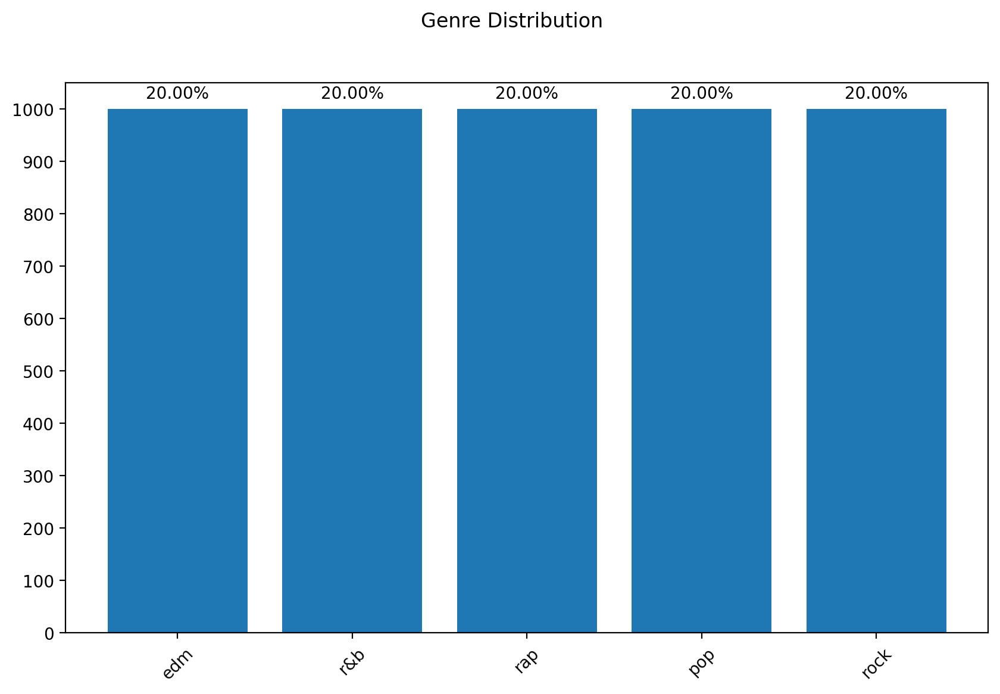

In [25]:
df_train = balanced_df_train
del balanced_df_train

plot_genre(df_train)
print(f"Train data shape: {df_train.shape}")

## Save the data


In [26]:
if (
    not df_train.isnull().values.any()
    and not df_val.isnull().values.any()
    and not df_test.isnull().values.any()
):
    df_train.to_csv("./data/train_clean.csv.zip", compression="zip")
    df_val.to_csv("./data/val_clean.csv.zip", compression="zip")
    df_test.to_csv("./data/test_clean.csv.zip", compression="zip")
    print("Data saved successfully")

Data saved successfully


# Baseline Model


In [27]:
baseline = DummyClassifier(strategy="stratified", random_state=12123)
baseline.fit(
    df_train[audio_feature_columns + lyrics_column], df_train["playlist_genre"]
)

DummyClassifier(random_state=12123, strategy='stratified')

In [28]:
predictions = baseline.predict(df_val[audio_feature_columns + lyrics_column])
print(classification_report(df_val["playlist_genre"], predictions))

              precision    recall  f1-score   support

         edm       0.11      0.19      0.14       155
         pop       0.24      0.18      0.20       330
         r&b       0.25      0.23      0.24       285
         rap       0.18      0.21      0.19       227
        rock       0.21      0.19      0.20       313

    accuracy                           0.20      1310
   macro avg       0.20      0.20      0.20      1310
weighted avg       0.21      0.20      0.20      1310

